In [2]:
import numpy as np 
import pandas as pd 
import os
!pip install dataprep 
from dataprep.eda import create_report
import  dataprep
import missingno
import matplotlib.pyplot as plt

# Dataset Statistics

In [45]:
data = pd.read_csv("../input/amazon-top-50-bestselling-books-2009-2019/bestsellers with categories.csv")
print("Number of rows : {}".format(data.shape[0]))
print("Number of columns : {}".format(data.shape[1]))
print("List of columsn : {}".format(list(data.columns)))
print("Number of duplicates : {}".format(len(data)-len(data.drop_duplicates())))
#print("Memory usage : {}".format(data.memory_usage()))

Number of rows : 550
Number of columns : 7
List of columsn : ['Name', 'Author', 'User Rating', 'Reviews', 'Price', 'Year', 'Genre']
Number of duplicates : 0


In [15]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 550 entries, 0 to 549
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Name         550 non-null    object 
 1   Author       550 non-null    object 
 2   User Rating  550 non-null    float64
 3   Reviews      550 non-null    int64  
 4   Price        550 non-null    int64  
 5   Year         550 non-null    int64  
 6   Genre        550 non-null    object 
dtypes: float64(1), int64(3), object(3)
memory usage: 30.2+ KB
None


In [66]:
print("Min Year : {}".format(data.Year.min()))
print("Max Year : {}".format(data.Year.max()))
print("Type Books : {}".format(data.Genre.unique()))
print("Number of diffrent Authors : {}".format(len(data.Author.unique())))
print("Number of diffrent Names : {}".format(len(data.Name.unique())))


Min Year : 2009
Max Year : 2019
Type Books : ['Non Fiction' 'Fiction']
Number of diffrent Authors : 248
Number of diffrent Names : 351


* Name has a high cardinality: 351 distinct values
*  Author has a high cardinality: 248 distinct values

  0%|          | 0/121 [00:00<?, ?it/s]


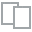
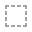
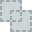
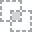
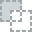
...
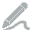
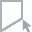
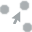
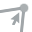
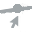

In [31]:
dataprep.eda.missing.plot_missing(data)

No Missing values

<AxesSubplot:>

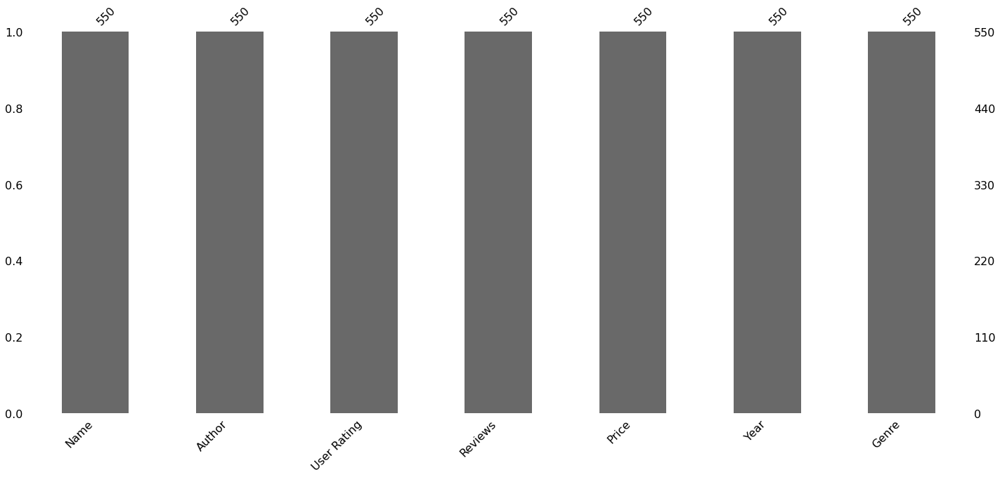

In [39]:
# visualay
missingno.bar(data)

# Dataset Insights

In [53]:
## Check for skwness of data 
data.skew()

User Rating   -1.502125
Reviews        2.421597
Price          3.685057
Year           0.000000
dtype: float64

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:1657: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.1 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)
/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/co

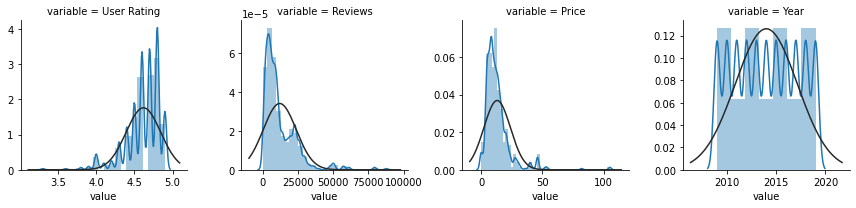

In [65]:
import seaborn as sns
from scipy.stats import skew, boxcox_normmax, norm
from scipy import stats

# Histogram to display skewness of every numeric variable
numeric_types = ["int","float"] 
f = pd.melt(data, value_vars = data.select_dtypes(numeric_types).columns)
g = sns.FacetGrid(f, col="variable",  col_wrap=4, sharex=False, sharey=False)
g.map(lambda _x, **kwargs: sns.distplot(_x, fit = norm, kde_kws={'bw': 0.1}), 'value');


None of the columns has a normal distribution 

In [77]:
data.select_dtypes[numeric_types].colums

TypeError: 'method' object is not subscriptable

<Figure size 1440x720 with 0 Axes>

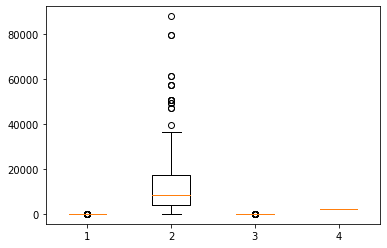

In [86]:
## Cheking for outliers
plt.figure(figsize=(20,10))
fig, ax = plt.subplots()
ax.boxplot(x=data[data.select_dtypes(numeric_types).columns])
plt.show()

In [96]:
## Clearly the reviews column has some outliers,
## Let's check for the most reviewd books 
outliers_ds = data[(data['Reviews']> 3*data['Reviews'].mean()) | (data['Reviews']< -3*data['Reviews'].mean())]
outliers_ds.shape

In [100]:
outliers_ds

,Name,Author,User Rating,Reviews,Price,Year,Genre
20,All the Light We Cannot See,Anthony Doerr,4.6,36348,14,2014,Fiction
21,All the Light We Cannot See,Anthony Doerr,4.6,36348,14,2015,Fiction
32,Becoming,Michelle Obama,4.8,61133,11,2018,Non Fiction
33,Becoming,Michelle Obama,4.8,61133,11,2019,Non Fiction
106,Fifty Shades of Grey: Book One of the Fifty Sh...,E L James,3.8,47265,14,2012,Fiction
107,Fifty Shades of Grey: Book One of the Fifty Sh...,E L James,3.8,47265,14,2013,Fiction
135,Gone Girl,Gillian Flynn,4.0,57271,10,2012,Fiction
136,Gone Girl,Gillian Flynn,4.0,57271,10,2013,Fiction
137,Gone Girl,Gillian Flynn,4.0,57271,9,2014,Fiction
365,The Fault in Our Stars,John Green,4.7,50482,13,2012,Fiction


In [99]:
outliers_ds['Author'].unique()

array(['Anthony Doerr', 'Michelle Obama', 'E L James', 'Gillian Flynn',
       'John Green', 'Paula Hawkins', 'Andy Weir', 'Kristin Hannah',
       'Delia Owens'], dtype=object)

In [101]:
outliers_ds['Name'].unique()

array(['All the Light We Cannot See', 'Becoming',
       'Fifty Shades of Grey: Book One of the Fifty Shades Trilogy (Fifty Shades of Grey Series)',
       'Gone Girl', 'The Fault in Our Stars', 'The Girl on the Train',
       'The Martian', 'The Nightingale: A Novel',
       'Where the Crawdads Sing'], dtype=object)

  0%|          | 0/312 [00:00<?, ?it/s]


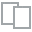
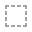
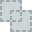
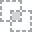
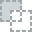
...
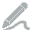
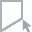
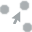
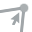
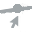

In [110]:
dataprep.eda.distribution.plot(data)

  0%|          | 0/1008 [00:00<?, ?it/s]

DataPrep Report
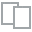
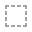
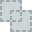
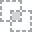
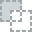
...
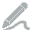
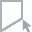
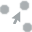
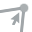
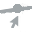

In [29]:
create_report(data)